In [83]:
import numpy as np
import pandas as pd
import os
import math
import matplotlib
from matplotlib import pyplot as plt
import csv
from scipy import stats
import scipy.integrate as integrate
import scipy.special as sp
import seaborn as sns
import networkx as nx
import datetime
from scipy.stats import spearmanr
from datetime import timedelta
import datetime
import scipy

In [84]:
os.chdir("C:\\Users\\Luka\\Downloads\\Dusan")

# I

### Select one-week of data from sms-call-internet-mi and mi-to-provinces-2013-month-day.txt files. For 3 (Duomo-5060, Navigli-4456, Bocconi-4259) locations plot graphs representing sms, calls and internet traffic (time series, boxplots, pie carts…).

In [85]:
def time1(x): #transform miliseconds into time and date
    a=int(x)//1000
    dtime=list(datetime.datetime.fromtimestamp(a).timetuple())[3:5]
    return datetime.time(dtime[0],dtime[1]) 
def date1(x):
    a=x//1000
    dtime=list(datetime.datetime.fromtimestamp(a).timetuple())[:3]
    return datetime.date(dtime[0],dtime[1],dtime[2])

In [4]:
data1 = pd.DataFrame(columns=['square id', 'date', 'time','sms-in','sms-out','call-in','call-out','internet'])

In [5]:
for i in range(1,8):  #make data frame with Duomo, Navigli and Bocconi for all days in a week
    data=pd.read_csv('sms-call-internet-mi-2013-11-0'+str(i)+'.txt', delimiter='\t',names=['square id', 'timetot', 'coutry code','sms-in','sms-out','call-in','call-out','internet'])
    data=data.fillna(0)
    data=data[data['square id'].isin([4259,4456,5060])]
    data['time']=pd.Series(np.zeros(data.shape[0]))
    data['date']=pd.Series(np.zeros(data.shape[0]))
    for i in range(data.shape[0]):
        data.iloc[i,8]=time1(data.iloc[i,1])
        data.iloc[i,9]=date1(data.iloc[i,1])
    
    for i in range(data.shape[0]):
        if data.iloc[i,0]==4259:
            data.iloc[i,0]='Bocconi'
        elif data.iloc[i,0]==4456:
            data.iloc[i,0]='Navigli'
        else:
            data.iloc[i,0]='Duomo'
            
    data = data.reset_index()    
    data = data.drop(['index','timetot', 'coutry code'], axis=1)
    
    grouped = data.groupby([data['square id'], data['date'], data['time']])
    grouped = grouped.sum()
    grouped = grouped.reset_index()
    data1= data1.append(grouped)

In [6]:
data1.head()

,square id,date,time,sms-in,sms-out,call-in,call-out,internet
0,Bocconi,2013-11-01,00:00:00,11.789725,6.852404,3.773789,6.445458,261.680295
1,Bocconi,2013-11-01,00:10:00,11.265749,5.577946,6.418808,9.095491,189.422673
2,Bocconi,2013-11-01,00:20:00,8.063427,5.676628,5.175108,5.692123,231.897982
3,Bocconi,2013-11-01,00:30:00,12.991224,3.949282,7.126379,6.335363,246.799168
4,Bocconi,2013-11-01,00:40:00,7.227403,6.531744,8.376926,7.967324,199.110807


In [7]:
duomo= pd.DataFrame(columns=['square id', 'date', 'time','sms-in','sms-out','call-in','call-out','internet']) #make Duomo data frame for all days
for i in range(data1.shape[0]):
    if data1.iloc[i,0]=='Duomo':
        duomo=duomo.append(data1.iloc[i,:],ignore_index = True)          

In [8]:
navigli = pd.DataFrame(columns=['square id', 'date', 'time','sms-in','sms-out','call-in','call-out','internet']) #make Navigli data frame for all days
for i in range(data1.shape[0]):
    if data1.iloc[i,0]=='Navigli':
        navigli=navigli.append(data1.iloc[i,:],ignore_index = True)

In [9]:
bocconi = pd.DataFrame(columns=['square id', 'date', 'time','sms-in','sms-out','call-in','call-out','internet']) #make Bocconi data frame for all days
for i in range(data1.shape[0]):
    if data1.iloc[i,0]=='Bocconi':
        bocconi=bocconi.append(data1.iloc[i,:],ignore_index = True)

In [10]:
duomo.head()

,square id,date,time,sms-in,sms-out,call-in,call-out,internet
0,Duomo,2013-11-01,00:00:00,9.514475,8.042794,10.640887,7.491857,392.178279
1,Duomo,2013-11-01,00:10:00,31.506584,19.263821,5.688516,9.964789,402.885548
2,Duomo,2013-11-01,00:20:00,11.184964,14.178539,5.475577,6.985289,350.060713
3,Duomo,2013-11-01,00:30:00,5.705827,4.624168,14.307482,9.192719,427.730728
4,Duomo,2013-11-01,00:40:00,13.705145,5.521523,8.264353,4.177014,434.044619


In [11]:
def barplot(location, name): #representing sms,call and internet traffic
    plt.figure(figsize=(15,20))
    plt.subplot(511)
    sns.boxplot(x='date', y="sms-in", data=location)
    plt.title(str(name)+' sms in')

    plt.subplot(512)
    sns.boxplot(x='date', y="sms-out", data=location)
    plt.title(str(name)+' sms out')
    
    plt.subplot(513)
    sns.boxplot(x='date', y="call-in", data=location)
    plt.title(str(name)+' call in')


    plt.subplot(514)
    sns.boxplot(x='date', y="call-out", data=location)
    plt.title(str(name)+' call out')

    
    plt.subplot(515)
    sns.boxplot(x='date', y="internet", data=location)
    plt.title(str(name)+ ' internet')

    matplotlib.pyplot.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.5)
    plt.savefig(str(name)+'barplot.png')
    plt.show()

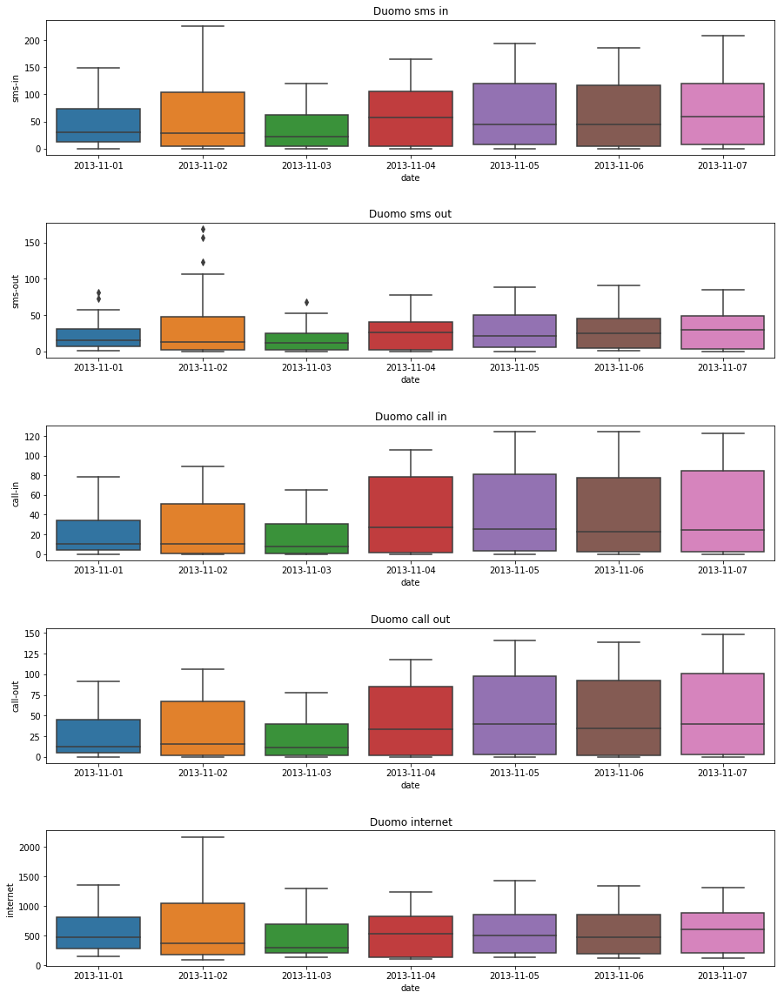

In [12]:
barplot(duomo, 'Duomo')

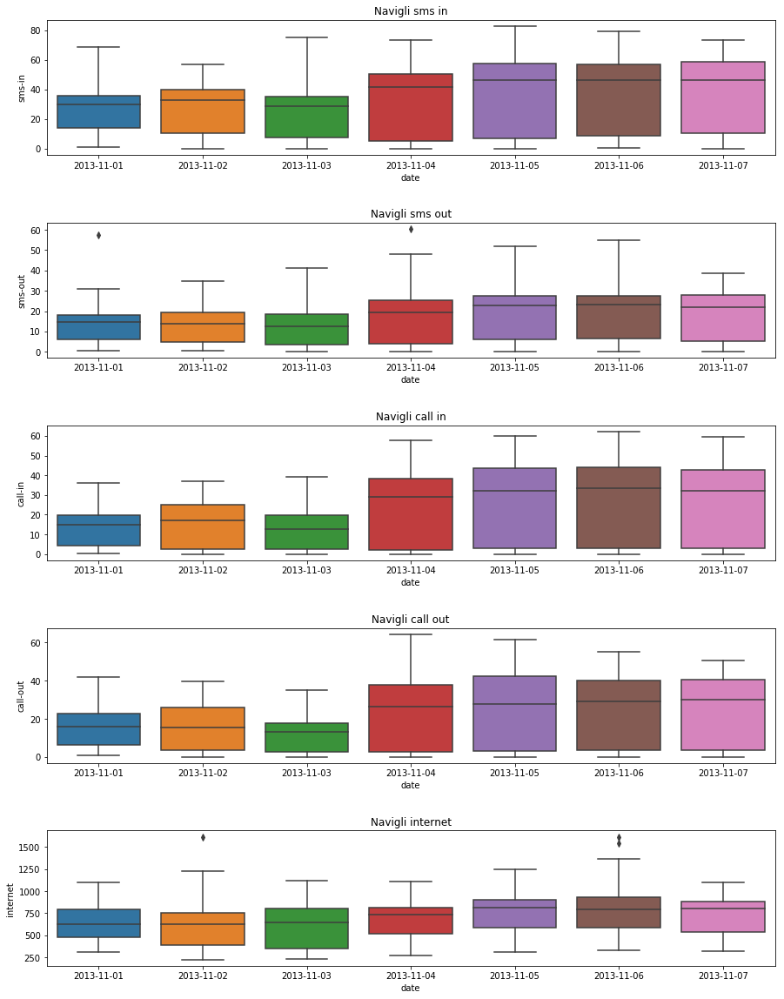

In [13]:
barplot(navigli, 'Navigli')

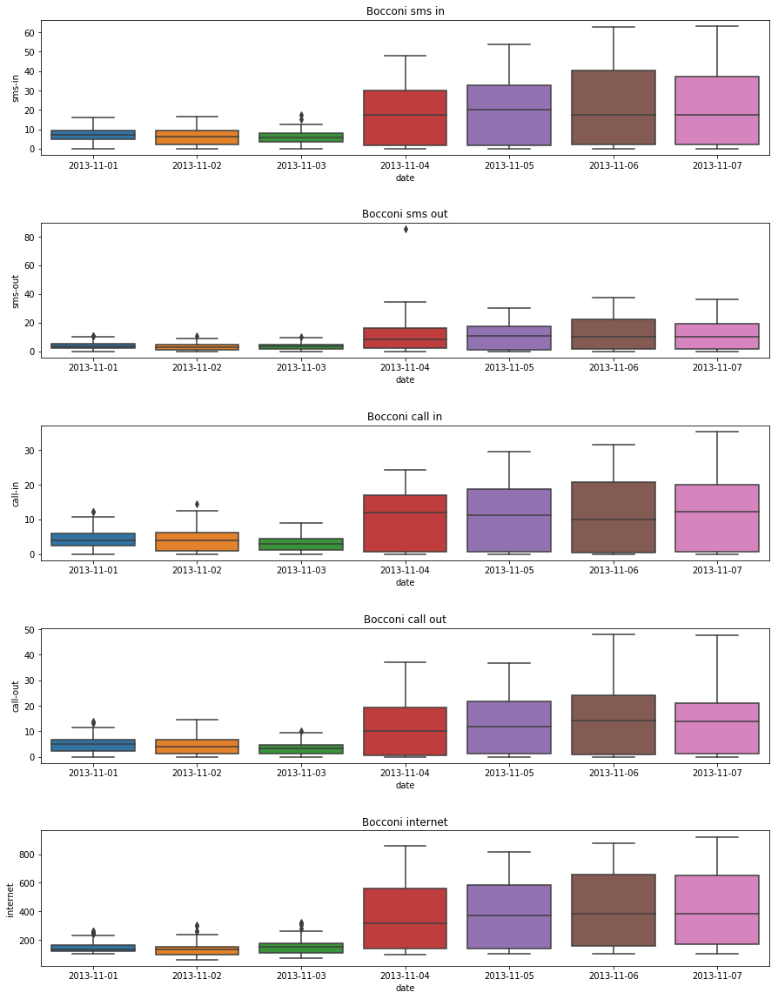

In [14]:
barplot(bocconi, 'Bocconi')

# II

### Calculate correlations between 3 locations and other square ids. Plot it spatially based on positions of square ids as heatmap.

In [86]:
names1=['square id', 'timetot', 'country code','sms-in','sms-out','call-in','call-out','internet'] 
day1 = pd.read_csv('sms-call-internet-mi-2013-11-01.txt', header=None, names=names1, delimiter = '\t')
day2 = pd.read_csv('sms-call-internet-mi-2013-11-02.txt', header=None, names=names1, delimiter = '\t')
day3 = pd.read_csv('sms-call-internet-mi-2013-11-03.txt', header=None, names=names1, delimiter = '\t')
day4 = pd.read_csv('sms-call-internet-mi-2013-11-04.txt', header=None, names=names1, delimiter = '\t')
day5 = pd.read_csv('sms-call-internet-mi-2013-11-05.txt', header=None, names=names1, delimiter = '\t')
day6 = pd.read_csv('sms-call-internet-mi-2013-11-06.txt', header=None, names=names1, delimiter = '\t')
day7 = pd.read_csv('sms-call-internet-mi-2013-11-07.txt', header=None, names=names1, delimiter = '\t')

day1.fillna(0, inplace=True)
day2.fillna(0, inplace=True)
day3.fillna(0, inplace=True)
day4.fillna(0, inplace=True)
day5.fillna(0, inplace=True)
day6.fillna(0, inplace=True)
day7.fillna(0, inplace=True)

In [87]:
day1['timetot']=day1['timetot'].apply(lambda x: time1(x))
day2['timetot']=day2['timetot'].apply(lambda x: time1(x))
day3['timetot']=day3['timetot'].apply(lambda x: time1(x))
day4['timetot']=day4['timetot'].apply(lambda x: time1(x))
day5['timetot']=day5['timetot'].apply(lambda x: time1(x))
day6['timetot']=day6['timetot'].apply(lambda x: time1(x))
day7['timetot']=day7['timetot'].apply(lambda x: time1(x))

In [88]:
def duomo_corr(day, name):   
    day = day.groupby([day['square id'], day['timetot']]).sum()
    day = day.reset_index()
    day = day.drop('country code', axis=1)
    
    data5060=day[day['square id']==5060] #duomo data frame
    data5060=data5060.reset_index()
    data5060=data5060.drop('index',axis=1)
    
    new3= pd.DataFrame(columns = [0],index = [i for i in range(10000)])
    for i in range(1,10001):
        data1 = day[day['square id']==i] #data frame with square id==i
        data1=data1.reset_index()
        data1=data1.drop('index',axis=1)
        new3.iloc[i-1]=np.mean(data5060.iloc[:,2:].corrwith(data1.iloc[:,2:], axis=0)) #correlation

    new= pd.DataFrame(columns = [j for j in range(1,101)],index = [i for i in range(100)])
    ind=0
    for i in range(0, new3.shape[0],100):
        new.iloc[ind,:]=new3.iloc[i:i+100,0].values
        ind=ind+1
    new=new.fillna(0)
    
    plt.figure(figsize=(15, 8))
    plt.title('Correlation between Duomo and other square ids in '+' '+str(name))
    sns.heatmap(new)  
    plt.savefig('Correlation between Duomo and other square ids.png')

In [112]:
def navigli_corr(day,name):
    day = day.groupby([day['square id'], day['timetot']]).sum()
    day = day.reset_index()
    day = day.drop('country code', axis=1)
    
    data4456=day[day['square id']==4456]
    data4456=data4456.reset_index()
    data4456=data4456.drop('index',axis=1)

    
    new3= pd.DataFrame(columns = [0],index = [i for i in range(10000)])
    for i in range(1,10001):
        data1 = day[day['square id']==i]
        data1=data1.reset_index()
        data1=data1.drop('index',axis=1)
        new3.iloc[i-1]=np.mean(data4456.iloc[:,2:].corrwith(data1.iloc[:,2:], axis=0))

    new= pd.DataFrame(columns = [j for j in range(1,101)],index = [i for i in range(100)])
    ind=0
    for i in range(0, new3.shape[0],100):
        new.iloc[ind,:]=new3.iloc[i:i+100,0].values
        ind=ind+1
    new=new.fillna(0)
    
    plt.figure(figsize=(15, 8))
    plt.title('Correlation between Navigli and other square ids  ' +str(name))
    sns.heatmap(new)   
    plt.savefig('Correlation between Navigli and other square ids.png')

In [113]:
def bocconi_corr(day,name):
    day = day.groupby([day['square id'], day['timetot']]).sum()
    day = day.reset_index()
    day = day.drop('country code', axis=1)
    
    data4259=day[day['square id']==4259]
    data4259=data4259.reset_index()
    data4259=data4259.drop('index',axis=1)

    
    new3= pd.DataFrame(columns = [0],index = [i for i in range(10000)])
    for i in range(1,10001):
        data1 = day[day['square id']==i]
        data1=data1.reset_index()
        data1=data1.drop('index',axis=1)
        new3.iloc[i-1]=np.mean(data4259.iloc[:,2:].corrwith(data1.iloc[:,2:], axis=0))

    new= pd.DataFrame(columns = [j for j in range(1,101)],index = [i for i in range(100)])
    ind=0
    for i in range(0, new3.shape[0],100):
        new.iloc[ind,:]=new3.iloc[i:i+100,0].values
        ind=ind+1
    new=new.fillna(0)
   
    plt.figure(figsize=(15, 8))
    plt.title('Correlation between Bocconi and other square ids  '+str(name))
    sns.heatmap(new) 
    plt.savefig('Correlation between Bocconi and other square ids.png')

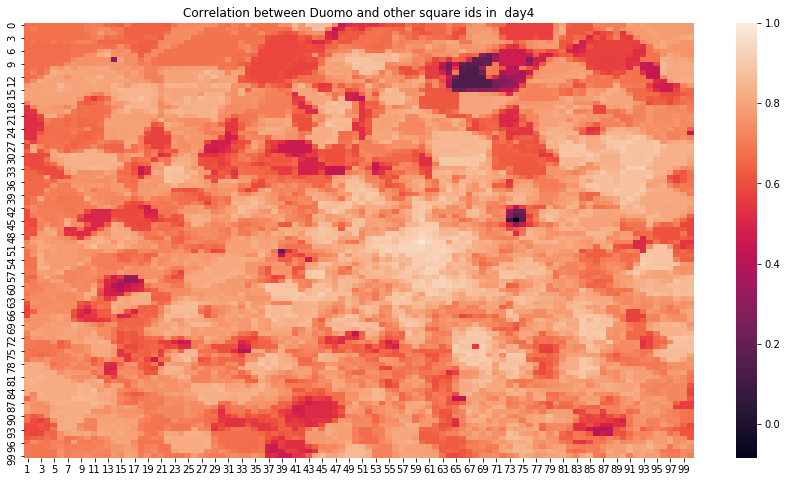

In [91]:
duomo_corr(day4,'day4')

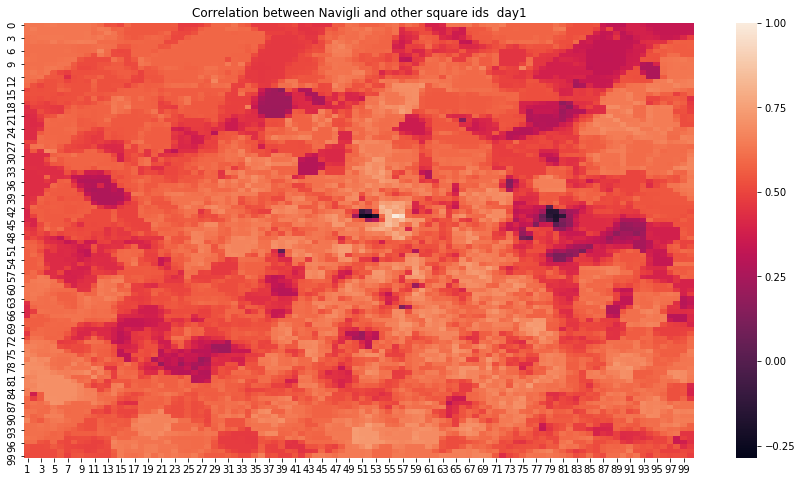

In [114]:
navigli_corr(day1,'day1')

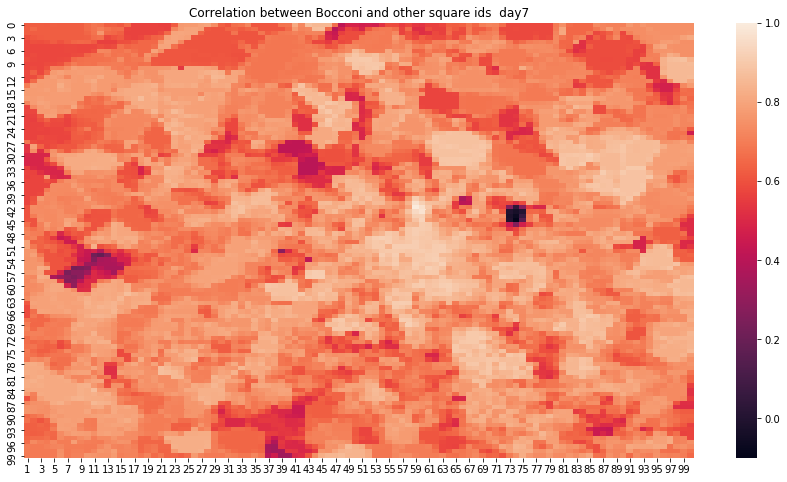

In [115]:
bocconi_corr(day7, 'day7')

# III

### From mi-to-provinces for each day sum traffic between 3 locations and provinces. Present it as ego graphs around 3 locations. Quantify largest changes between different days. 

In [25]:
data2 = pd.DataFrame(columns=['square id', 'province', 'date','mi to prov', 'prov to mi'])

In [26]:
for i in range(1,8):
    data=pd.read_csv('mi-to-provinces-2013-11-0'+str(i)+'.txt', delimiter='\t',names=['square id', 'province','timestamp','mi to prov', 'prov to mi'])
    data=data.fillna(0)
    data=data[data['square id'].isin([4259,4456,5060])]
    data['date']=pd.Series(np.zeros(data.shape[0]))
    for i in range(data.shape[0]):
        data.iloc[i,5]=date1(data.iloc[i,2])
    
    data = data.reset_index()    
    data = data.drop(['index','timestamp'], axis=1)
    
    for i in range(data.shape[0]):
        if data.loc[i,'square id']==4259:
            data.loc[i,'square id']='Bocconi'
        elif data.loc[i,'square id']==4456:
            data.loc[i,'square id']='Navigli'
        else:
            data.loc[i,'square id']='Duomo'
    
    
    grouped = data.groupby([data['square id'], data['province'], data['date']])
    grouped = grouped.sum()
    grouped = grouped.reset_index()
    data2= data2.append(grouped)

In [27]:
data2=data2.reset_index()
data2 = data2.drop('index', axis=1) 

data2['suma']= data2['mi to prov']+data2['prov to mi']
data2=data2.drop(['mi to prov','prov to mi'], axis = 1)

In [28]:
data2.head()

,square id,province,date,suma
0,Bocconi,AGRIGENTO,2013-11-01,1.942757
1,Bocconi,ALESSANDRIA,2013-11-01,0.370888
2,Bocconi,AREZZO,2013-11-01,3.349654
3,Bocconi,ASTI,2013-11-01,0.250891
4,Bocconi,AVELLINO,2013-11-01,0.331232


In [29]:
G1= data2[data2['square id']=='Bocconi'] #Bocconi data frame with provinces
G1= G1.pivot_table(values='suma', index='province', columns='date')
G1= G1.dropna()

G2= data2[data2['square id']=='Duomo']
G2= G2.pivot_table(values='suma', index='province', columns='date')
G2= G2.fillna(0)

G3= data2[data2['square id']=='Navigli']
G3= G3.pivot_table(values='suma', index='province', columns='date')
G3= G3.fillna(0)

In [30]:
G1['Max']=G1.max(axis=1)
G1['Min']=G1.min(axis=1)
G1['Change']=G1['Max']-G1['Min']
G1=G1.sort_values('Change', ascending=False)

G2['Max']=G2.max(axis=1)
G2['Min']=G2.min(axis=1)
G2['Change']=G2['Max']-G2['Min']
G2=G2.sort_values('Change', ascending=False)

G3['Max']=G3.max(axis=1)
G3['Min']=G3.min(axis=1)
G3['Change']=G3['Max']-G3['Min']
G3=G3.sort_values('Change', ascending=False)

In [31]:
G1.head()

date,2013-11-01,2013-11-02,2013-11-03,2013-11-04,2013-11-05,2013-11-06,2013-11-07,Max,Min,Change
province,,,,,,,,,,
MILANO,233.604166,257.971018,169.253605,569.002595,632.876277,649.750997,635.822945,649.750997,169.253605,480.497392
ROMA,4.790629,6.347136,9.216870,40.791717,30.954642,44.475374,34.313637,44.475374,4.790629,39.684746
MONZA E DELLA BRIANZA,4.548643,8.702212,3.115531,20.882199,23.278200,17.617176,28.933896,28.933896,3.115531,25.818365
PAVIA,8.806345,10.096731,3.661447,19.709898,17.886105,24.775104,27.530380,27.530380,3.661447,23.868934
NAPOLI,7.428740,5.400676,2.410800,17.103293,17.843101,21.083970,17.937027,21.083970,2.410800,18.673170


In [32]:
provinces_list = np.unique(data2['province'])

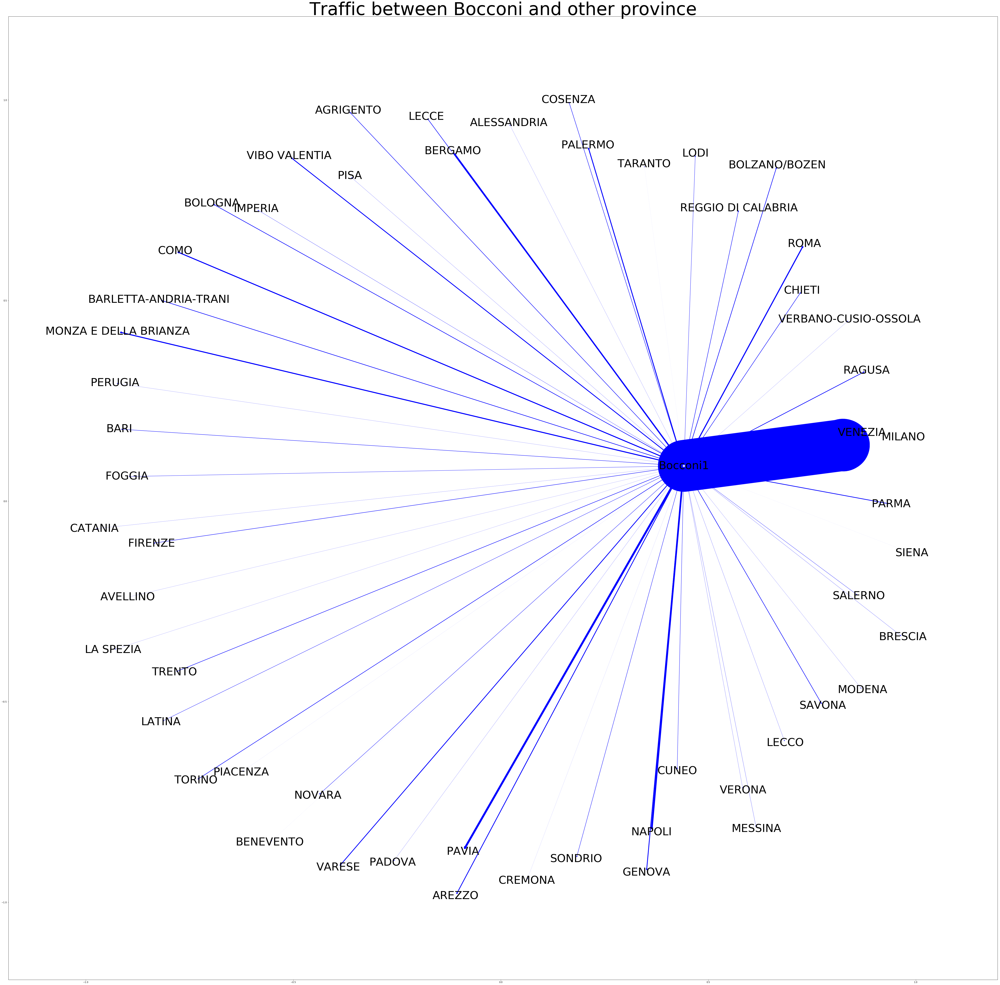

In [33]:
G1_Bocconi = nx.DiGraph()
G1_Bocconi.add_nodes_from(provinces_list)
G1_Bocconi.add_nodes_from(['Bocconi'+str(i) for i in range(1,8)])
for i in range(1,8):
    for t in G1.index:
        G1_Bocconi.add_edge('Bocconi'+str(i), t, weight=G1.loc[t,datetime.date(2013,11,i)])
        
        
fig = plt.figure(figsize = (80,80))
E1 = nx.ego_graph(G1_Bocconi, 'Bocconi1', radius = 1)

edgewidth1=[]
edgelabels1={}
pos1 = nx.spring_layout(E1) 

for (u,v,d) in E1.edges(data=True):
    #print(u,v,d)
    edgewidth1.append(d['weight'])
    edgelabels1[(u,v)] = d['weight']
nx.draw_networkx_edges(E1,pos1,width=edgewidth1,edge_color='b')
nx.draw_networkx_nodes(E1,pos1, alpha=0.8, node_size=100 ,node_color='w')
nx.draw_networkx_labels(E1,pos1, font_size=50)

plt.title("Traffic between Bocconi and other province",size = 80)
plt.savefig('Traffic Bocconi.png')
plt.show()

In [34]:
G2_Duomo = nx.DiGraph()
G2_Duomo.add_nodes_from(provinces_list)
G2_Duomo.add_nodes_from(['Duomo'+str(i) for i in range(1,8)])
for i in range(1,8):
    for t in G2.index:
        G2_Duomo.add_edge('Duomo'+str(i), t, weight=G2.loc[t,datetime.date(2013,11,i)])
        
        
fig = plt.figure(figsize = (170,170))
E2 = nx.ego_graph(G2_Duomo, 'Duomo3', radius = 1)


edgewidth2=[]
edgelabels2={}
pos2 = nx.spring_layout(E2) 

for (u,v,d) in E2.edges(data=True):
    #print(u,v,d)
    edgewidth2.append(d['weight'])
    edgelabels2[(u,v)] = d['weight']
    

nx.draw_networkx_edges(E2,pos2,width=edgewidth2,edge_color='b')
nx.draw_networkx_nodes(E2,pos2, alpha=0.8, node_size=1000 ,node_color='w')
nx.draw_networkx_labels(E2,pos2, font_size=80)

plt.title("Traffic between Duomo and other province",size = 170)
plt.savefig("Traffic Duomo.png")
plt.show()

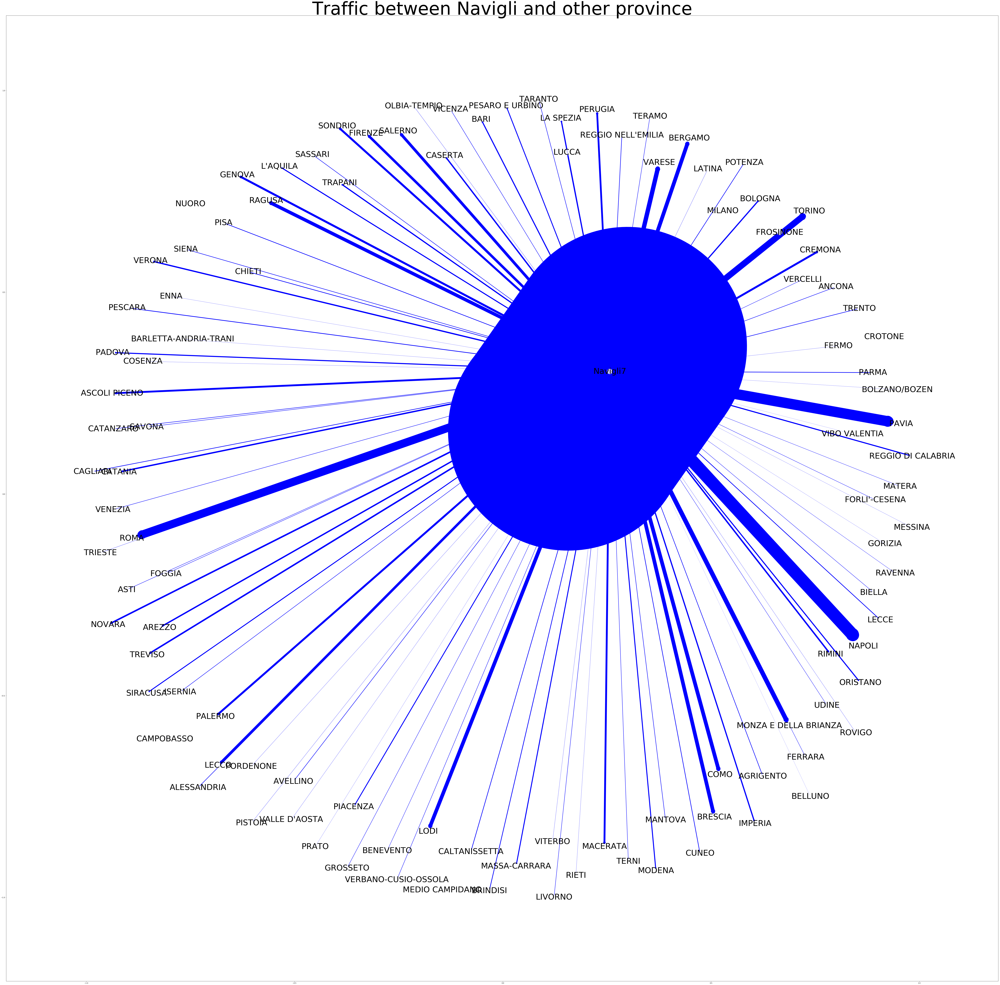

In [35]:
G3_Navigli = nx.DiGraph()
G3_Navigli.add_nodes_from(provinces_list)
G3_Navigli.add_nodes_from(['Navigli'+str(i) for i in range(1,8)])

for i in range(1,8):
    for t in G3.index:
        G3_Navigli.add_edge('Navigli'+str(i), t, weight=G3.loc[t,datetime.date(2013,11,i)])
        
fig = plt.figure(figsize = (110,110))
E3 = nx.ego_graph(G3_Navigli, 'Navigli7', radius = 1)

edgewidth3=[]
edgelabels3={}
pos3 = nx.spring_layout(E3) 

for (u,v,d) in E3.edges(data=True):
    #print(u,v,d)
    edgewidth3.append(d['weight'])
    edgelabels3[(u,v)] = d['weight']
    
nx.draw_networkx_edges(E3,pos3,width=edgewidth3,edge_color='b')
nx.draw_networkx_nodes(E3,pos3, alpha=0.8, node_size=1000 ,node_color='w')
nx.draw_networkx_labels(E3,pos3, font_size=50) 

plt.title("Traffic between Navigli and other province",size = 110)
plt.savefig("Traffic Navigli.png")
plt.show()

# IV

### Group by interactions over provinces and square ids (sum interaction strengths).Select two provinces and on the city level present summed interactions. 

In [97]:
names=['square id', 'province','timestamp','mi to prov', 'prov to mi']
pd1 = pd.read_csv('mi-to-provinces-2013-11-01.txt', header=None, names=names, delimiter = '\t')
pd2 = pd.read_csv('mi-to-provinces-2013-11-02.txt', header=None, names=names, delimiter = '\t')
pd3 = pd.read_csv('mi-to-provinces-2013-11-03.txt', header=None, names=names, delimiter = '\t')
pd4 = pd.read_csv('mi-to-provinces-2013-11-04.txt', header=None, names=names, delimiter = '\t')
pd5 = pd.read_csv('mi-to-provinces-2013-11-05.txt', header=None, names=names, delimiter = '\t')
pd6 = pd.read_csv('mi-to-provinces-2013-11-06.txt', header=None, names=names, delimiter = '\t')
pd7 = pd.read_csv('mi-to-provinces-2013-11-07.txt', header=None, names=names, delimiter = '\t')

pd1.fillna(0, inplace=True)
pd2.fillna(0, inplace=True)
pd3.fillna(0, inplace=True)
pd4.fillna(0, inplace=True)
pd5.fillna(0, inplace=True)
pd6.fillna(0, inplace=True)
pd7.fillna(0, inplace=True)

In [98]:
def inter(d , province):
    d=d.groupby([d['square id'], d['province']])
    d=d.sum()
    d=d.reset_index()
    
    d=d[d.province == province]
    d=d.reset_index()
    d['interaction']=d['mi to prov']+d["prov to mi"]
    d=d.drop(['index' , 'timestamp', "mi to prov", "prov to mi"] , axis=1)
    
    square_ids = [i for i in range(1, 10001)]
    i = d.shape[0]
    for square_id in square_ids:
        if (d['square id'] == square_id).any():
            pass
        else:
            d.loc[i] = [square_id , province , 0]
            i += 1
        
        
    d = d.sort_values(by=['square id']) 
    d = d.reset_index()
    d = d.drop(d.columns[[0,1,2]], axis=1)
    
    new= pd.DataFrame(columns = [j for j in range(1,101)],index = [i for i in range(100)])
    ind=0
    for i in range(0, d.shape[0],100):
        new.iloc[ind,:]=d.iloc[i:i+100,0].values
        ind=ind+1
    new=new.fillna(0)
   
    plt.figure(figsize=(15, 8))
    plt.title('Interaction over '+str(province)+' and square ids')
    sns.heatmap(new)
    plt.savefig('Interaction over '+str(province)+' and square ids.png')

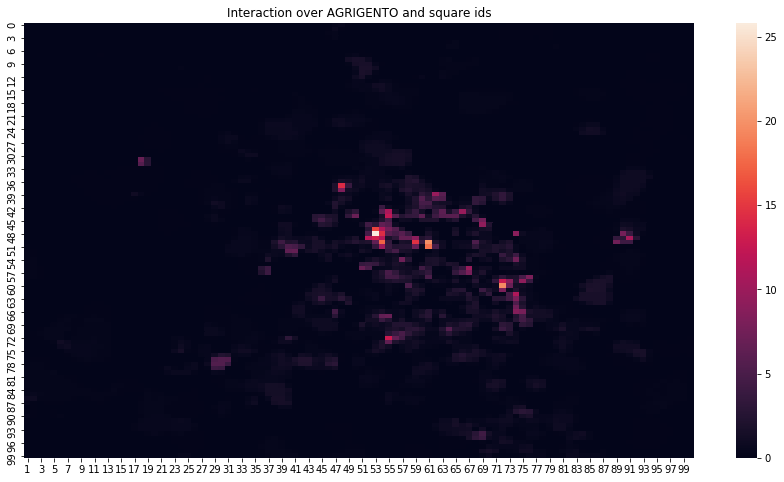

In [99]:
inter(pd1,'AGRIGENTO')

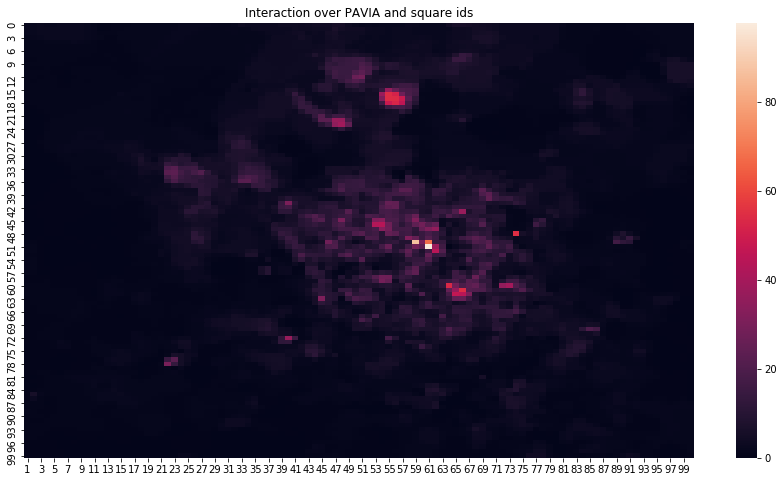

In [100]:
inter(pd1, 'PAVIA')

# V

### Measure correlation between summed overall interaction to provinces and GDP in provinces.

In [46]:
GDP = pd.read_excel('GDP.xlsx', delimiter='\n', skiprows=0,unpack=True) #GDP-gross domestic product
GDP=GDP.drop(GDP.columns[1],axis=1)

In [123]:
GDP.head()

,Unnamed: 0,Unnamed: 2
0,AGRIGENTO,6558.0
1,ALESSANDRIA,11722.0
2,ANCONA,13855.0
3,AREZZO,9445.0
4,ASCOLI PICENO,5181.0


In [47]:
for p in (pd1,pd2,pd3,pd4,pd5,pd6,pd7):
    p1=p.drop(p.columns[[0,2]],axis=1)
    p1['suma']=p1['mi to prov']+p1["prov to mi"]
    p1=p1.drop(p1.columns[[1,2]],axis=1)
    p1=p1.groupby('province')
    p1=p1.sum()
    p1=p1.reset_index()

In [48]:
p1.head()

,province,suma
0,AGRIGENTO,3849.885201
1,ALESSANDRIA,6079.436765
2,ANCONA,4847.057647
3,AREZZO,4213.177264
4,ASCOLI PICENO,1465.200056


In [50]:
p1['GDP'] = GDP.loc[:,'Unnamed: 2']
p1.head()

,province,suma,GDP
0,AGRIGENTO,3849.885201,6558.0
1,ALESSANDRIA,6079.436765,11722.0
2,ANCONA,4847.057647,13855.0
3,AREZZO,4213.177264,9445.0
4,ASCOLI PICENO,1465.200056,5181.0


In [51]:
p1.corr()

,suma,GDP
suma,1.000000,0.658975
GDP,0.658975,1.000000


In [44]:
p1['suma'].corr(p1['GDP'])

0.6589750469055506

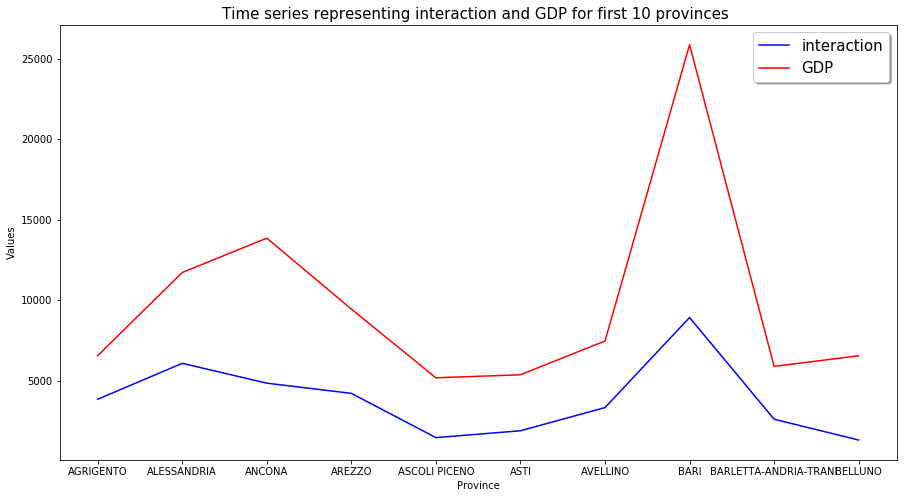

In [52]:
plt.figure(figsize=(15, 8))
plt.plot(p1['province'][:10], p1['suma'][:10], 'b-', label = 'interaction')
plt.plot(p1['province'][:10],p1['GDP'][:10], 'r-', label = 'GDP')
plt.xlabel('Province')
plt.ylabel('Values')
plt.title('Time series representing interaction and GDP for first 10 provinces ', fontsize = 15)
plt.savefig('Time series representing interaction and GDP for first 10 provinces.png')
plt.legend(loc='best', shadow=True, fancybox=True, fontsize = 15)


# VI

### Measure entropy for each square-id and detect where are the locations with high entropy and where with low.


In [101]:
def entropy(day,name):
    day['suma']=day["mi to prov"]+day["prov to mi"]
    day=day.drop(day.columns[[1,2,3,4]], axis=1)
    day=day.reset_index()
    day=day.drop("index", axis=1)
    
    g_sum = day.groupby('square id')['suma'].transform('sum')
    g_sum=g_sum.reset_index()
    g_sum=g_sum.drop('index',axis=1)
    values = day['suma']/g_sum['suma']
    day['Entropy'] = -(values*np.log(values))
    
    day1 = day.groupby('square id',as_index=False,sort=False)['Entropy'].sum()
    day1 = day1.sort_values(by=['square id'], ascending=True)
    day1 = day1.reset_index() 
    day1 = day1.drop('index', axis = 1)
    
    new1= pd.DataFrame(columns = [j for j in range(1,101)],index = [i for i in range(100)])
    ind=0
    for i in range(0, day1.shape[0],100):
        new1.iloc[ind,:]=day1.iloc[i:i+100,1].values
        ind=ind+1
    new1=new1.fillna(0)
    
    print('Max entropy:' , day1.max()
    print('Min entropy:' , day1.min()
          
    plt.figure(figsize=(15, 8))
    plt.title('Entropy for each square id in '+str(name))
    sns.heatmap(new1)
    plt.savefig('Entropy.png')

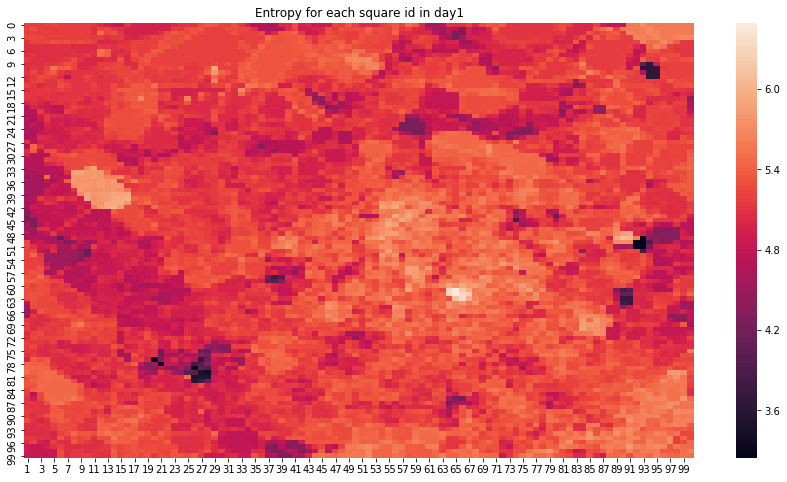

In [102]:
entropy(pd1,'day1')

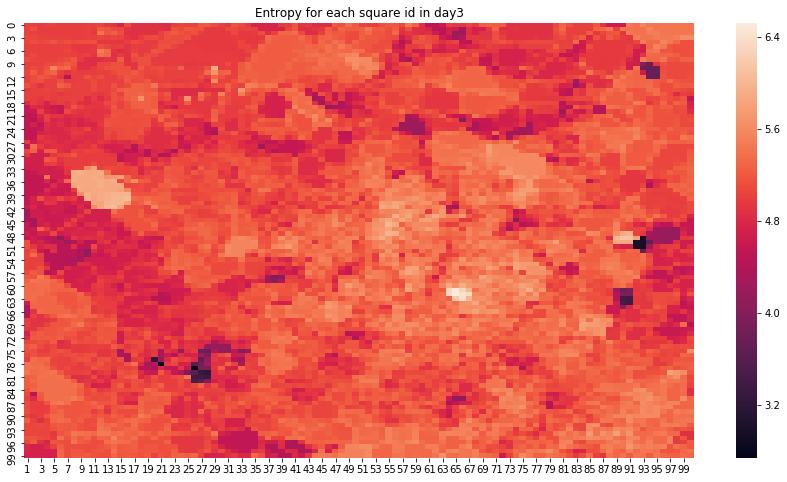

In [121]:
entropy(pd3,'day3')
plt.savefig('Entropy3.png')

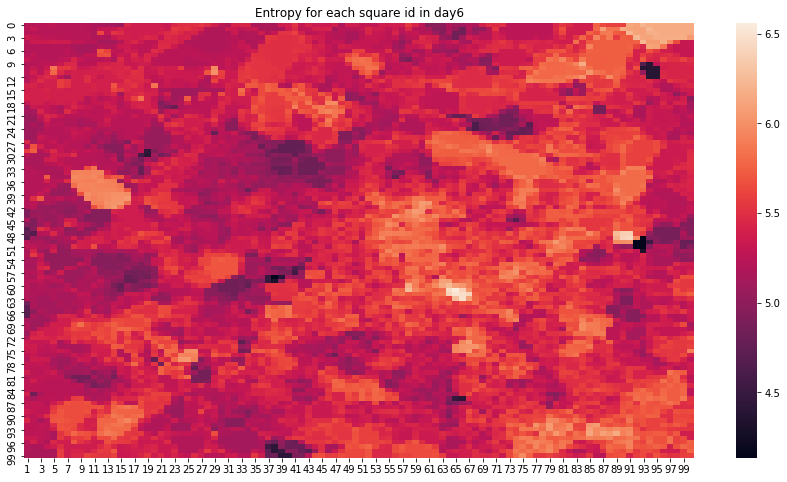

In [122]:
entropy(pd6,'day6')
plt.savefig('Entropy6.png')

# VII

### Select christmas week and compare traffic with chosen week between days.

In [57]:
data_bozic=pd.DataFrame(columns=['square id', 'date', 'time','sms-in','sms-out','call-in','call-out','internet'])

In [58]:
for i in range(24,31):
    data=pd.read_csv('sms-call-internet-mi-2013-12-'+str(i)+'.txt', delimiter='\t',names=['square id', 'timetot', 'coutry code','sms-in','sms-out','call-in','call-out','internet'])
    data=data.fillna(0)
    data=data[data['square id'].isin([4259,4456,5060])]
    data['time']=pd.Series(np.zeros(data.shape[0]))
    data['date']=pd.Series(np.zeros(data.shape[0]))
    for i in range(data.shape[0]):
        data.iloc[i,8]=time1(data.iloc[i,1])
        data.iloc[i,9]=date1(data.iloc[i,1])
    
    for i in range(data.shape[0]):
        if data.iloc[i,0]==4259:
            data.iloc[i,0]='Bocconi'
        elif data.iloc[i,0]==4456:
            data.iloc[i,0]='Navigli'
        else:
            data.iloc[i,0]='Duomo'
            
    data = data.reset_index()    
    data = data.drop(['index','timetot', 'coutry code'], axis=1)
    
    grouped = data.groupby([data['square id'], data['date'], data['time']])
    grouped = grouped.sum()
    grouped = grouped.reset_index()
    data_bozic= data_bozic.append(grouped)

In [59]:
duomo_bozic= pd.DataFrame(columns=['square id', 'date', 'time','sms-in','sms-out','call-in','call-out','internet'])
for i in range(data_bozic.shape[0]):
    if data_bozic.iloc[i,0]=='Duomo':
        duomo_bozic=duomo_bozic.append(data_bozic.iloc[i,:],ignore_index = True) 

In [60]:
navigli_bozic = pd.DataFrame(columns=['square id', 'date', 'time','sms-in','sms-out','call-in','call-out','internet'])
for i in range(data_bozic.shape[0]):
    if data_bozic.iloc[i,0]=='Navigli':
        navigli_bozic=navigli_bozic.append(data_bozic.iloc[i,:],ignore_index = True)

In [61]:
bocconi_bozic = pd.DataFrame(columns=['square id', 'date', 'time','sms-in','sms-out','call-in','call-out','internet'])
for i in range(data_bozic.shape[0]):
    if data_bozic.iloc[i,0]=='Bocconi':
        bocconi_bozic=bocconi_bozic.append(data_bozic.iloc[i,:],ignore_index = True)

In [62]:
duomo['sms']=duomo['sms-in']+duomo['sms-out']
duomo['calls']=duomo['call-in']+duomo['call-out']
duomo_bozic['sms']=duomo_bozic['sms-in']+duomo_bozic['sms-out']
duomo_bozic['calls']=duomo_bozic['call-in']+duomo_bozic['call-out']

In [63]:
navigli['sms']=navigli['sms-in']+navigli['sms-out']
navigli['calls']=navigli['call-in']+navigli['call-out']
navigli_bozic['sms']=navigli_bozic['sms-in']+navigli_bozic['sms-out']
navigli_bozic['calls']=navigli_bozic['call-in']+navigli_bozic['call-out']

In [64]:
bocconi['sms']=bocconi['sms-in']+bocconi['sms-out']
bocconi['calls']=bocconi['call-in']+bocconi['call-out']
bocconi_bozic['sms']=bocconi_bozic['sms-in']+bocconi_bozic['sms-out']
bocconi_bozic['calls']=bocconi_bozic['call-in']+bocconi_bozic['call-out']

In [65]:
duomo.head() #all days

,square id,date,time,sms-in,sms-out,call-in,call-out,internet,sms,calls
0,Duomo,2013-11-01,00:00:00,9.514475,8.042794,10.640887,7.491857,392.178279,17.557269,18.132743
1,Duomo,2013-11-01,00:10:00,31.506584,19.263821,5.688516,9.964789,402.885548,50.770405,15.653305
2,Duomo,2013-11-01,00:20:00,11.184964,14.178539,5.475577,6.985289,350.060713,25.363502,12.460866
3,Duomo,2013-11-01,00:30:00,5.705827,4.624168,14.307482,9.192719,427.730728,10.329996,23.500200
4,Duomo,2013-11-01,00:40:00,13.705145,5.521523,8.264353,4.177014,434.044619,19.226668,12.441366


In [66]:
duomo_bozic.head() #all days

,square id,date,time,sms-in,sms-out,call-in,call-out,internet,sms,calls
0,Duomo,2013-12-24,00:00:00,1.065518,3.450385,1.558791,1.464200,185.887851,4.515903,3.022991
1,Duomo,2013-12-24,00:10:00,3.250348,3.815037,5.018062,3.964907,125.932038,7.065385,8.982968
2,Duomo,2013-12-24,00:20:00,8.610206,3.409245,1.205386,4.420721,194.931567,12.019452,5.626108
3,Duomo,2013-12-24,00:30:00,0.395453,1.110759,2.253054,0.763409,154.183052,1.506212,3.016463
4,Duomo,2013-12-24,00:40:00,3.820765,4.523381,5.689426,0.000000,170.966142,8.344146,5.689426


In [67]:
duomo1=duomo[duomo['date']==datetime.date(2013,11,1)] # duomo data frame with first day
duomo1=duomo1.reset_index()
duomo1=duomo1.drop('index',axis=1)

duomo2=duomo[duomo['date']==datetime.date(2013,11,2)]
duomo2=duomo2.reset_index()
duomo2=duomo2.drop('index',axis=1)

duomo3=duomo[duomo['date']==datetime.date(2013,11,3)]
duomo3=duomo3.reset_index()
duomo3=duomo3.drop('index',axis=1)

duomo4=duomo[duomo['date']==datetime.date(2013,11,4)]
duomo4=duomo4.reset_index()
duomo4=duomo4.drop('index',axis=1)

duomo5=duomo[duomo['date']==datetime.date(2013,11,5)]
duomo5=duomo5.reset_index()
duomo5=duomo5.drop('index',axis=1)

duomo6=duomo[duomo['date']==datetime.date(2013,11,6)]
duomo6=duomo6.reset_index()
duomo6=duomo6.drop('index',axis=1)

duomo7=duomo[duomo['date']==datetime.date(2013,11,7)]
duomo7=duomo7.reset_index()
duomo7=duomo7.drop('index',axis=1)

In [68]:
duomo1.head()

,square id,date,time,sms-in,sms-out,call-in,call-out,internet,sms,calls
0,Duomo,2013-11-01,00:00:00,9.514475,8.042794,10.640887,7.491857,392.178279,17.557269,18.132743
1,Duomo,2013-11-01,00:10:00,31.506584,19.263821,5.688516,9.964789,402.885548,50.770405,15.653305
2,Duomo,2013-11-01,00:20:00,11.184964,14.178539,5.475577,6.985289,350.060713,25.363502,12.460866
3,Duomo,2013-11-01,00:30:00,5.705827,4.624168,14.307482,9.192719,427.730728,10.329996,23.500200
4,Duomo,2013-11-01,00:40:00,13.705145,5.521523,8.264353,4.177014,434.044619,19.226668,12.441366


In [69]:
duomo1_bozic=duomo_bozic[duomo_bozic['date']== datetime.date(2013,12,24)] #duomo_bozic data frame with first day in christmas week
duomo1_bozic=duomo1_bozic.reset_index()
duomo1_bozic=duomo1_bozic.drop('index',axis=1)

duomo2_bozic=duomo_bozic[duomo_bozic['date']== datetime.date(2013,12,25)]
duomo2_bozic=duomo2_bozic.reset_index()
duomo2_bozic=duomo2_bozic.drop('index',axis=1)

duomo3_bozic=duomo_bozic[duomo_bozic['date']== datetime.date(2013,12,26)]
duomo3_bozic=duomo3_bozic.reset_index()
duomo3_bozic=duomo3_bozic.drop('index',axis=1)

duomo4_bozic=duomo_bozic[duomo_bozic['date']== datetime.date(2013,12,27)]
duomo4_bozic=duomo4_bozic.reset_index()
duomo4_bozic=duomo4_bozic.drop('index',axis=1)

duomo5_bozic=duomo_bozic[duomo_bozic['date']== datetime.date(2013,12,28)]
duomo5_bozic=duomo5_bozic.reset_index()
duomo5_bozic=duomo5_bozic.drop('index',axis=1)

duomo6_bozic=duomo_bozic[duomo_bozic['date']== datetime.date(2013,12,29)]
duomo6_bozic=duomo6_bozic.reset_index()
duomo6_bozic=duomo6_bozic.drop('index',axis=1)

duomo7_bozic=duomo_bozic[duomo_bozic['date']== datetime.date(2013,12,30)]
duomo7_bozic=duomo7_bozic.reset_index()
duomo7_bozic=duomo7_bozic.drop('index',axis=1)

In [70]:
duomo1_bozic.head()

,square id,date,time,sms-in,sms-out,call-in,call-out,internet,sms,calls
0,Duomo,2013-12-24,00:00:00,1.065518,3.450385,1.558791,1.464200,185.887851,4.515903,3.022991
1,Duomo,2013-12-24,00:10:00,3.250348,3.815037,5.018062,3.964907,125.932038,7.065385,8.982968
2,Duomo,2013-12-24,00:20:00,8.610206,3.409245,1.205386,4.420721,194.931567,12.019452,5.626108
3,Duomo,2013-12-24,00:30:00,0.395453,1.110759,2.253054,0.763409,154.183052,1.506212,3.016463
4,Duomo,2013-12-24,00:40:00,3.820765,4.523381,5.689426,0.000000,170.966142,8.344146,5.689426


In [71]:
navigli1=navigli[navigli['date']==datetime.date(2013,11,1)]
navigli1=navigli1.reset_index()
navigli1=navigli1.drop('index',axis=1)

navigli2=navigli[navigli['date']==datetime.date(2013,11,2)]
navigli2=navigli2.reset_index()
navigli2=navigli2.drop('index',axis=1)

navigli3=navigli[navigli['date']==datetime.date(2013,11,3)]
navigli3=navigli3.reset_index()
navigli3=navigli3.drop('index',axis=1)

navigli4=navigli[navigli['date']==datetime.date(2013,11,4)]
navigli4=navigli4.reset_index()
navigli4=navigli4.drop('index',axis=1)

navigli5=navigli[navigli['date']==datetime.date(2013,11,5)]
navigli5=navigli5.reset_index()
navigli5=navigli5.drop('index',axis=1)

navigli6=navigli[navigli['date']==datetime.date(2013,11,6)]
navigli6=navigli6.reset_index()
navigli6=navigli6.drop('index',axis=1)

navigli7=navigli[navigli['date']==datetime.date(2013,11,7)]
navigli7=navigli7.reset_index()
navigli7=navigli7.drop('index',axis=1)

In [72]:
navigli1_bozic=navigli_bozic[navigli_bozic['date']==datetime.date(2013,12,24)]
navigli1_bozic=navigli1_bozic.reset_index()
navigli1_bozic=navigli1_bozic.drop('index',axis=1)

navigli2_bozic=navigli_bozic[navigli_bozic['date']==datetime.date(2013,12,25)]
navigli2_bozic=navigli2_bozic.reset_index()
navigli2_bozic=navigli2_bozic.drop('index',axis=1)

navigli3_bozic=navigli_bozic[navigli_bozic['date']==datetime.date(2013,12,26)]
navigli3_bozic=navigli3_bozic.reset_index()
navigli3_bozic=navigli3_bozic.drop('index',axis=1)

navigli4_bozic=navigli_bozic[navigli_bozic['date']==datetime.date(2013,12,27)]
navigli4_bozic=navigli4_bozic.reset_index()
navigli4_bozic=navigli4_bozic.drop('index',axis=1)

navigli5_bozic=navigli_bozic[navigli_bozic['date']==datetime.date(2013,12,28)]
navigli5_bozic=navigli5_bozic.reset_index()
navigli5_bozic=navigli5_bozic.drop('index',axis=1)

navigli6_bozic=navigli_bozic[navigli_bozic['date']==datetime.date(2013,12,29)]
navigli6_bozic=navigli6_bozic.reset_index()
navigli6_bozic=navigli6_bozic.drop('index',axis=1)

navigli7_bozic=navigli_bozic[navigli_bozic['date']==datetime.date(2013,12,30)]
navigli7_bozic=navigli7_bozic.reset_index()
navigli7_bozic=navigli7_bozic.drop('index',axis=1)

In [73]:
bocconi1=bocconi[bocconi['date']==datetime.date(2013,11,1)]
bocconi1=bocconi1.reset_index()
bocconi1=bocconi1.drop('index',axis=1)

bocconi2=bocconi[bocconi['date']==datetime.date(2013,11,2)]
bocconi2=bocconi2.reset_index()
bocconi2=bocconi2.drop('index',axis=1)

bocconi3=bocconi[bocconi['date']==datetime.date(2013,11,3)]
bocconi3=bocconi3.reset_index()
bocconi3=bocconi3.drop('index',axis=1)

bocconi4=bocconi[bocconi['date']==datetime.date(2013,11,4)]
bocconi4=bocconi4.reset_index()
bocconi4=bocconi4.drop('index',axis=1)

bocconi5=bocconi[bocconi['date']==datetime.date(2013,11,5)]
bocconi5=bocconi5.reset_index()
bocconi5=bocconi5.drop('index',axis=1)

bocconi6=bocconi[bocconi['date']==datetime.date(2013,11,6)]
bocconi6=bocconi6.reset_index()
bocconi6=bocconi6.drop('index',axis=1)

bocconi7=bocconi[bocconi['date']==datetime.date(2013,11,7)]
bocconi7=bocconi7.reset_index()
bocconi7=bocconi7.drop('index',axis=1)

In [74]:
bocconi1_bozic=bocconi_bozic[bocconi_bozic['date']==datetime.date(2013,12,24)]
bocconi1_bozic=bocconi1_bozic.reset_index()
bocconi1_bozic=bocconi1_bozic.drop('index',axis=1)

bocconi2_bozic=bocconi_bozic[bocconi_bozic['date']==datetime.date(2013,12,25)]
bocconi2_bozic=bocconi2_bozic.reset_index()
bocconi2_bozic=bocconi2_bozic.drop('index',axis=1)

bocconi3_bozic=bocconi_bozic[bocconi_bozic['date']==datetime.date(2013,12,26)]
bocconi3_bozic=bocconi3_bozic.reset_index()
bocconi3_bozic=bocconi3_bozic.drop('index',axis=1)

bocconi4_bozic=bocconi_bozic[bocconi_bozic['date']==datetime.date(2013,12,27)]
bocconi4_bozic=bocconi4_bozic.reset_index()
bocconi4_bozic=bocconi4_bozic.drop('index',axis=1)

bocconi5_bozic=bocconi_bozic[bocconi_bozic['date']==datetime.date(2013,12,28)]
bocconi5_bozic=bocconi5_bozic.reset_index()
bocconi5_bozic=bocconi5_bozic.drop('index',axis=1)

bocconi6_bozic=bocconi_bozic[bocconi_bozic['date']==datetime.date(2013,12,29)]
bocconi6_bozic=bocconi6_bozic.reset_index()
bocconi6_bozic=bocconi6_bozic.drop('index',axis=1)

bocconi7_bozic=bocconi_bozic[bocconi_bozic['date']==datetime.date(2013,12,30)]
bocconi7_bozic=bocconi7_bozic.reset_index()
bocconi7_bozic=bocconi7_bozic.drop('index',axis=1)

In [108]:
def series(day , christmas_day,nameday,namechris):
    plt.figure(figsize=(20, 20))
    
    plt.subplot(511)
    plt.plot(day['time'], day['sms'], 'b-', label = ' sms')
    plt.plot(christmas_day['time'], christmas_day['sms'], 'r-', label = 'chistmas sms')
    plt.xlabel('Time')
    plt.ylabel('Number of sms')
    plt.title('Time series representing sms for '+ str(nameday) + ' and '+ str(namechris))
    plt.legend(loc='best', shadow=True, fancybox=True, fontsize = 10)
    
    plt.subplot(512)
    plt.plot(day['time'], day['calls'], 'b-', label = 'calls')
    plt.plot(christmas_day['time'], christmas_day['calls'], 'r-', label = 'chistmas calls')
    plt.xlabel('Time')
    plt.ylabel('Number of calls')
    plt.title('Time series representing calls for '+ str(nameday) + ' and '+ str(namechris))
    plt.legend(loc='best', shadow=True, fancybox=True, fontsize = 10)
    
    plt.subplot(513)
    plt.plot(day['time'], day['internet'], 'b-', label = 'internet')
    plt.plot(christmas_day['time'], christmas_day['internet'], 'r-', label = 'chistmas internet')
    plt.xlabel('Time')
    plt.ylabel('Internet')
    plt.title('Time series representing sms internet '+ str(nameday) + ' and '+ str(namechris))
    plt.legend(loc='best', shadow=True, fancybox=True, fontsize = 10)
    
    matplotlib.pyplot.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.5)
    plt.savefig('Christmas.png')

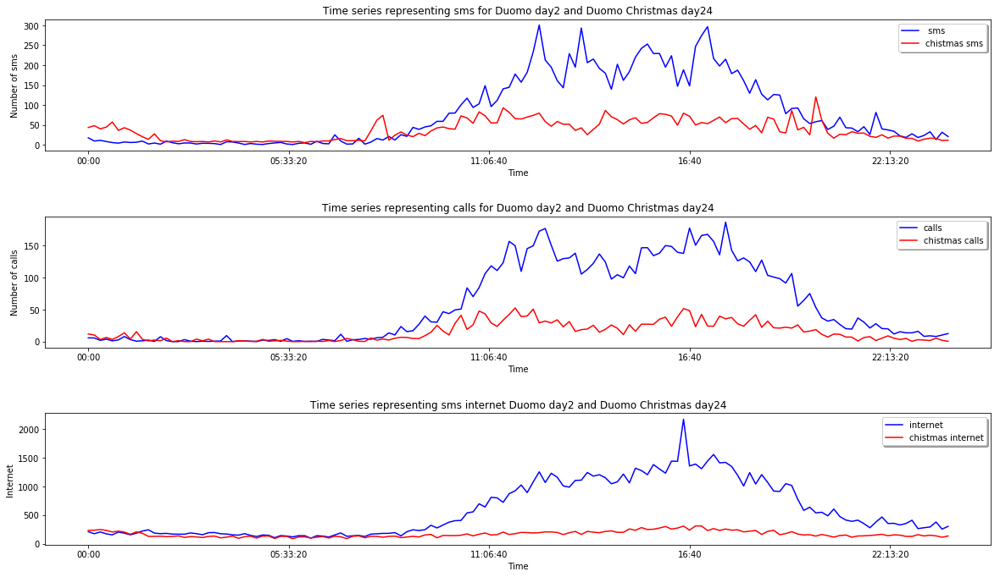

In [119]:
series(duomo2, duomo2_bozic, 'Duomo day2', 'Duomo Christmas day24')
plt.savefig('Christmas4.png')

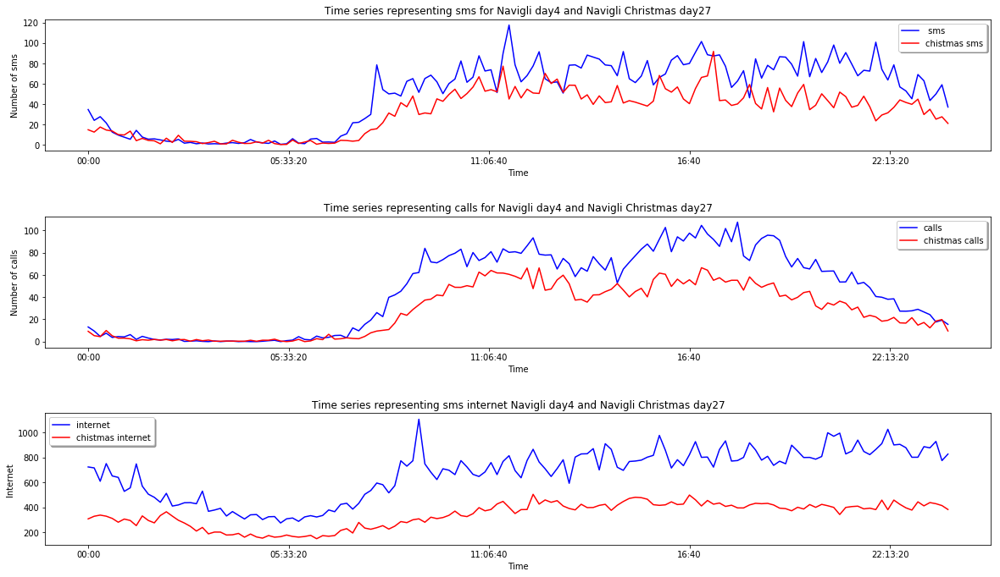

In [120]:
series(navigli4,navigli4_bozic , 'Navigli day4', 'Navigli Christmas day27')
plt.savefig('Christmas5.png')

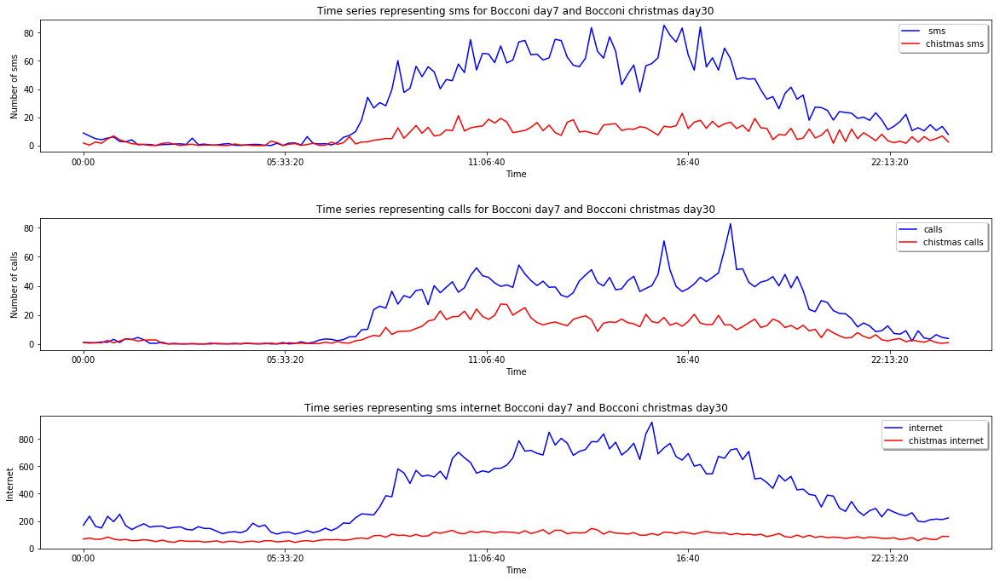

In [111]:
series(bocconi7,bocconi7_bozic, 'Bocconi day7', 'Bocconi christmas day30')